# Vision por computadora I - TP3

Por Menara Agustin - menaragustin@gmail.com

Tiempo de ejecución estimado: 116 segs

**Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en 
Material_TPs/TP3/images a partir del template Material_TPs/TP3/template**

In [1]:
import numpy as np
import cv2 as cv
print(f'Version de OpenCV: {cv.__version__}')
import matplotlib.pyplot as plt
import time
import os
# %matplotlib 

Version de OpenCV: 4.8.1


In [2]:
# Marca temporal para estimar tiempo de ejecución del notebook
since = time.time()

## Funciones auxiliares

Se agrupan funciones que se utilizan a lo largo del TP:

In [3]:
def gaussian_pyramid(img:np.array, num_levels:int)->list:
    '''
    Función para generar piramide gaussiana

    Parameters:
    img: imagen a escalar
    num_levels: cantidad de niveles de la piramide

    Return:
    gaussian_pyr: lista de arrays con imagen escalada por octavas
    '''
    lower = img.copy()
    gaussian_pyr = [lower]
    for i in range(num_levels):
        lower = cv.pyrDown(lower)
        gaussian_pyr.append(np.float32(lower))
    return gaussian_pyr


def nms_python(bboxes,psocres,threshold):
    '''
    NMS: first sort the bboxes by scores , 
        keep the bbox with highest score as reference,
        iterate through all other bboxes, 
        calculate Intersection Over Union (IOU) between reference bbox and other bbox
        if iou is greater than threshold,then discard the bbox and continue.
        
    Input:
        bboxes(numpy array of tuples) : Bounding Box Proposals in the format (x_min,y_min,x_max,y_max).
        pscores(numpy array of floats) : confidance scores for each bbox in bboxes.
        threshold(float): Overlapping threshold above which proposals will be discarded.
        
    Output:
        filtered_bboxes(numpy array) :selected bboxes for which IOU is less than threshold. 
    '''
    #Unstacking Bounding Box Coordinates
    bboxes = bboxes.astype('float')
    x_min = bboxes[:,0]
    y_min = bboxes[:,1]
    x_max = bboxes[:,2]
    y_max = bboxes[:,3]
    
    #Sorting the pscores in descending order and keeping respective indices.
    sorted_idx = psocres.argsort()[::-1]
    #Calculating areas of all bboxes.Adding 1 to the side values to avoid zero area bboxes.
    bbox_areas = (x_max-x_min+1)*(y_max-y_min+1)
    
    #list to keep filtered bboxes.
    filtered = []
    while len(sorted_idx) > 0:
        #Keeping highest pscore bbox as reference.
        rbbox_i = sorted_idx[0]
        #Appending the reference bbox index to filtered list.
        filtered.append(rbbox_i)
        
        #Calculating (xmin,ymin,xmax,ymax) coordinates of all bboxes w.r.t to reference bbox
        overlap_xmins = np.maximum(x_min[rbbox_i],x_min[sorted_idx[1:]])
        overlap_ymins = np.maximum(y_min[rbbox_i],y_min[sorted_idx[1:]])
        overlap_xmaxs = np.minimum(x_max[rbbox_i],x_max[sorted_idx[1:]])
        overlap_ymaxs = np.minimum(y_max[rbbox_i],y_max[sorted_idx[1:]])
        
        #Calculating overlap bbox widths,heights and there by areas.
        overlap_widths = np.maximum(0,(overlap_xmaxs-overlap_xmins+1))
        overlap_heights = np.maximum(0,(overlap_ymaxs-overlap_ymins+1))
        overlap_areas = overlap_widths*overlap_heights
        
        #Calculating IOUs for all bboxes except reference bbox
        ious = overlap_areas/(bbox_areas[rbbox_i]+bbox_areas[sorted_idx[1:]]-overlap_areas)
        
        #select indices for which IOU is greather than threshold
        delete_idx = np.where(ious > threshold)[0]+1
        delete_idx = np.concatenate(([0],delete_idx))
        
        #delete the above indices
        sorted_idx = np.delete(sorted_idx,delete_idx)
        
    
    #Return filtered bboxes
    return bboxes[filtered].astype('int'),psocres[filtered]




def apply_clahe_eq(img:np.array)-> np.array:
    '''
    Función para aplicar ecualización de histogramas adaptativo

    Parameters:
    img: imagen a ecualizar

    Return:
    img_eqzd: imagen ecualizada
    '''
    # create a CLAHE object (Arguments are optional).
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_eqzd = clahe.apply(img)


    return img_eqzd

## Template Matching


### Exploracion inicial

Leemos la imagen del logo:

In [4]:
logo_img_path = './template/pattern.png'
logo = cv.imread(logo_img_path)
logo_gray = cv.cvtColor(logo, cv.COLOR_BGR2GRAY)
logo_gray.shape

(175, 400)

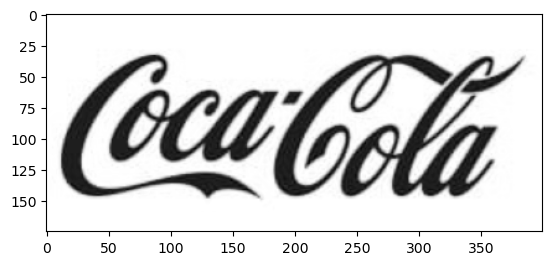

In [5]:
plt.imshow(logo_gray, cmap='gray')
plt.show()

Aplicamos binarizacion para definir bien los bordes

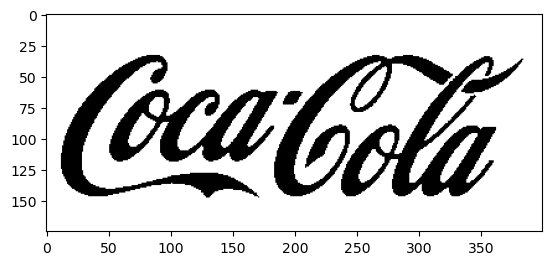

In [6]:
(thresh, logo_bw) = cv.threshold(logo_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
plt.imshow(logo_bw,cmap='gray')
plt.show()

Generamos el negativo del logo para pruebas futuras:

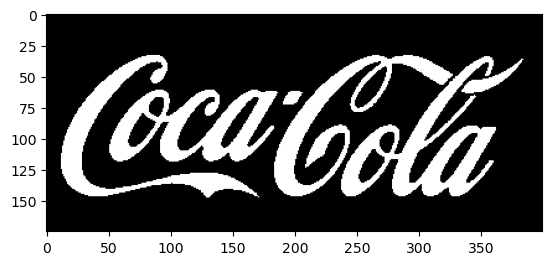

In [7]:
logo_wb = np.where(logo_bw>100,0,logo_bw)
logo_wb = np.where(logo_bw<=100,255,logo_wb)
plt.imshow(logo_wb,cmap='gray')
plt.show()

Extraemos los bordes

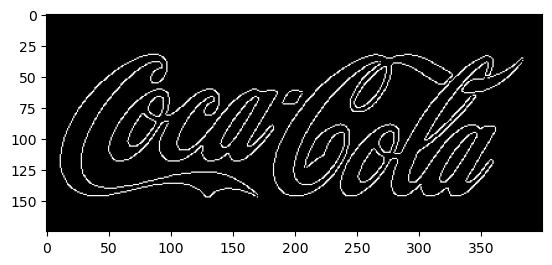

In [8]:
logo_edges = cv.Canny(logo_bw, threshold1=10, threshold2=10)
(_, logo_edges_bw) = cv.threshold(logo_edges, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
plt.imshow(logo_edges_bw, cmap='gray')
plt.show()


Generamos el negativo de bordes ara probar opciones más adelante

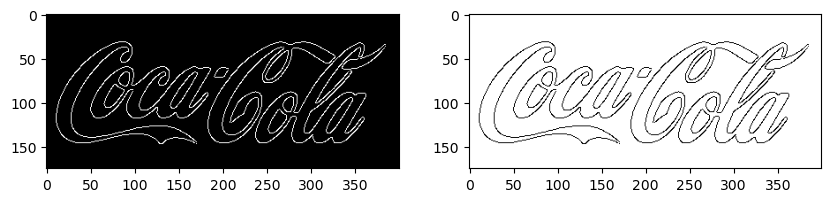

In [9]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(logo_edges_bw, cmap='gray')
logo_edges_wb = np.where(logo_edges_bw>100, 0, logo_edges_bw)
logo_edges_wb = np.where(logo_edges_bw<=100, 255, logo_edges_wb)
plt.subplot(1,2,2)
plt.imshow(logo_edges_wb, cmap='gray')
plt.show()

Una vez que leemos el logo a detectar, pasamos a buscarlo en las imágenes target.

### **1. Obtener una detección del logo en cada imagen sin falsos positivos**

Se analiza cada imagen en particular, ajustando parámetros del proceso para optimizar el match.

En todas la imágenes se corre el mismo proceso:

* se escala el logo pre-procesado en la exploracion inicial
* se genera una piramide gausiana con el logo escalado
* se lee la imagen a buscar y se pre-procesa igual que el logo
* se corre Template-Matching
* se filtra por el máximo valor de matcheo

Los únicos parametros que se ajustan entre imagenes son el escaleo del logo, la imagen de la piramide generada que se utiliza para el Template-Matching, y en alguna imagen se cropea el logo a buscar para mejorar el match, porque el logo está deformado por la curvatura de la lata.

#### coca_logo_1.png

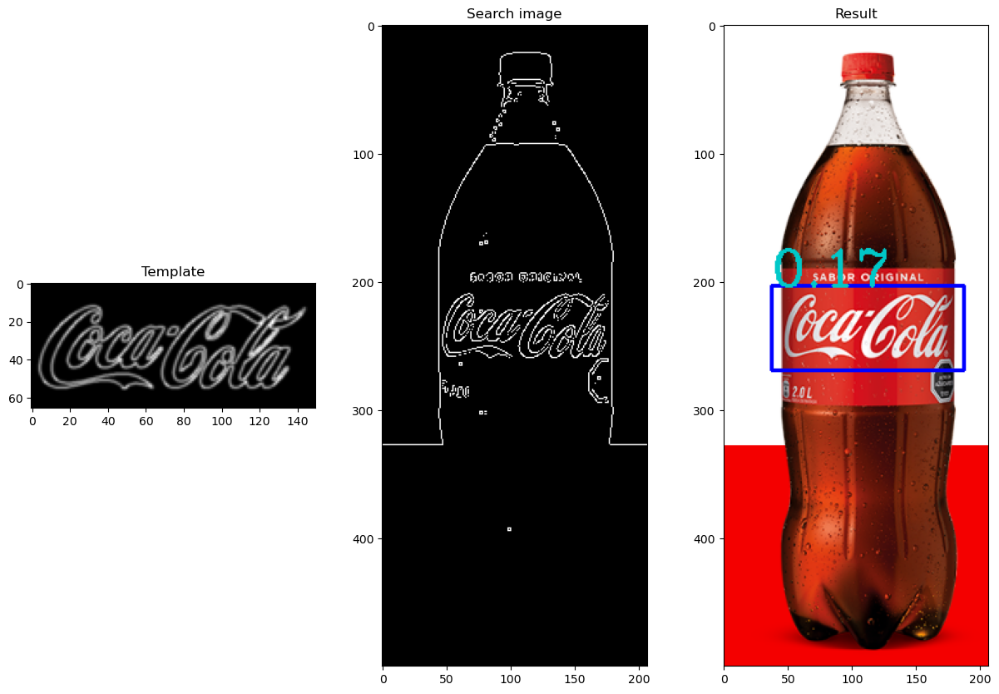

In [10]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=3, fy=3)
gp = gaussian_pyramid(gp_prev, 4)
template = np.uint8(gp[3])

# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'coca_logo_1.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)

# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(15,10))
plt.subplot(1,n_figs,1)
plt.imshow(template,cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]

# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)

for pt in zip(*loc[::-1]):
    img_rgb = cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=2)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### coca_logo_2.png

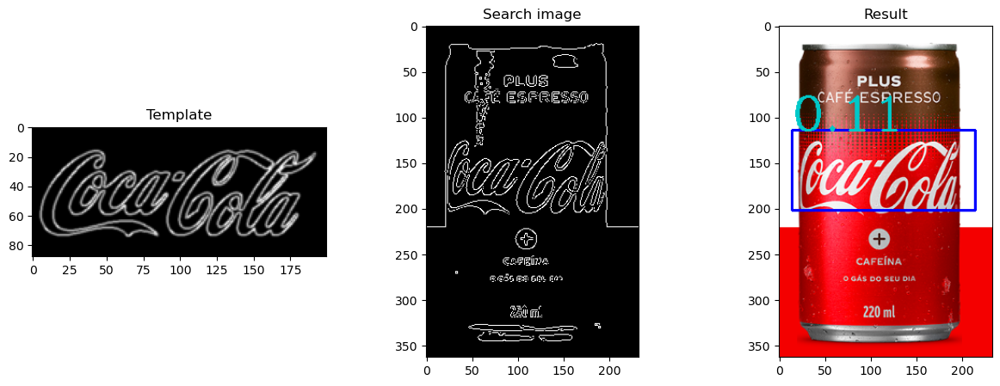

In [11]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=2, fy=2)
gp = gaussian_pyramid(gp_prev, 4)
template = np.uint8(gp[2])

# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'coca_logo_2.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)


# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(15,5))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]

# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=2)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### coca_multi.png

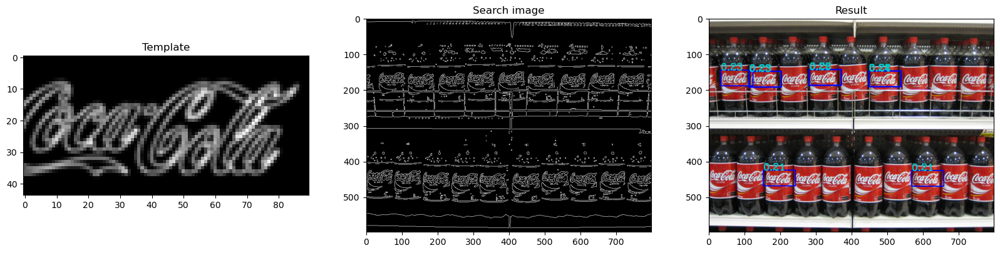

In [12]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=1, fy=1)
gp = gaussian_pyramid(gp_prev, 3)
template = np.uint8(gp[2])
template = template[:,10:120]



# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'coca_multi.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)



# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(20,10))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]

# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()*0.85
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=2)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### coca_retro_1.png

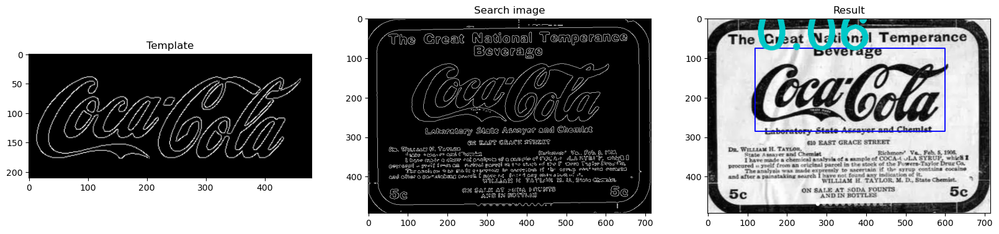

In [13]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=1.2, fy=1.2)
gp = gaussian_pyramid(gp_prev, 3)
template = np.uint8(gp[0])

# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'coca_retro_1.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)

# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(20,10))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]

# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=10)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### coca_retro_2.png

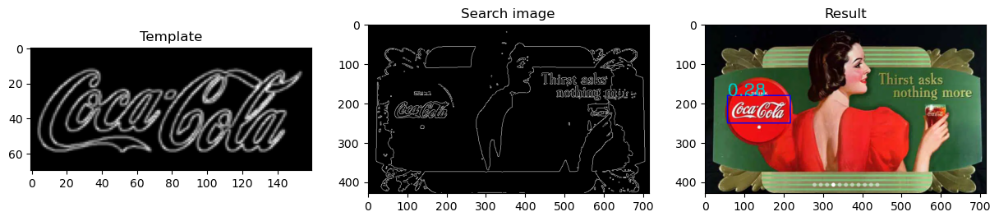

In [14]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=0.8, fy=0.8)
gp = gaussian_pyramid(gp_prev, 3)
template = np.uint8(gp[1])



# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'coca_retro_2.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
img_bw = np.where(img_gray > 150,255,img_gray)
img_bw = np.where(img_gray<=150,0, img_bw)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)



# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(15,5))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]


# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=2)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### COCA-COLA-LOGO.jpg

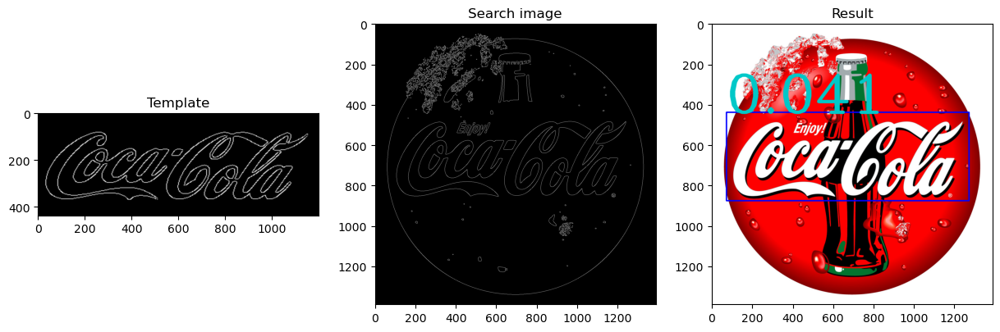

In [15]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=3, fy=2.5)
gp = gaussian_pyramid(gp_prev, 3)
template = np.uint8(gp[0])


# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'COCA-COLA-LOGO.jpg'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)


# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(15,5))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]


# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 5)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],3)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=15)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


#### logo_1.png

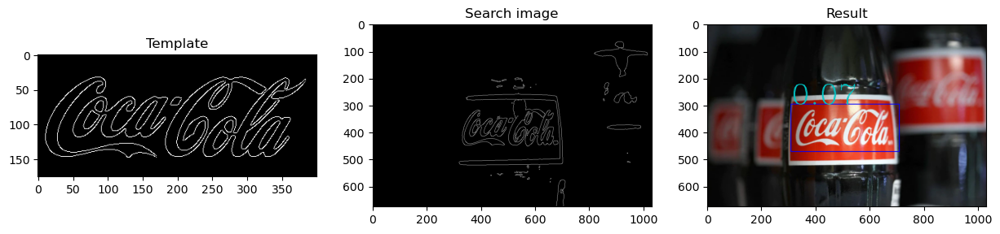

In [16]:
# Se escala el logo y se genera una piramide gaussiana
gp_prev = cv.resize(logo_edges_bw, None, fx=1, fy=1)
gp = gaussian_pyramid(gp_prev, 3)
template = np.uint8(gp[0])


# Leemos la imagen target y procesamos de la misma forma que el logo
root = './images'
img_name = 'logo_1.png'
img_path = cv.imread(f'{root}/{img_name}')

img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
img_rgb = cv.resize(img_rgb, None, fx=1.5, fy=1.5)
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
_,img_bw = cv.threshold(img_gray, 150, 255, cv.THRESH_BINARY)
edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)



# Ploteamos el template y la imagen de busqueda
n_figs = 3
plt.figure(figsize=(15,5))
plt.subplot(1,n_figs,1)
plt.imshow(np.uint8(template),cmap='gray')
plt.title('Template')

plt.subplot(1,n_figs,2)
plt.imshow(edges2,cmap='gray')
plt.title('Search image')
w, h = template.shape[::-1]


# Corremos el Template-Matching
res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

threshold = res.max()
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
    cv.putText(img_rgb,str(round(res[pt[1],pt[0]],2)),pt,fontFace=3,fontScale=h*0.02,color=(0,200,200),thickness=2)

plt.subplot(1,n_figs,3)
plt.imshow(img_rgb)
plt.title('Result')
plt.show()


### **2. Plantear y validar un algoritmo para múltiples detecciones en la imagen coca_multi.png con el mismo témplate del ítem 1**

In [17]:
def get_multi_detections(template_path:str, img_path:str, resize_template:tuple=None, resize_img:tuple=None, threshold_p:float=1.0, n_pyramids=3) -> (list,list):
    ''' 
    Funcion para detectar un template multiples veces en una unica imagen

    Parameters:

    template_path: path al template a buscar
    img_path: path a la imagen en la que se quiere detectar el template
    resize_template: tupla con factores de resize para el template, (fx,fy)
    resize_img: tupla con factores de resize para la imagen, (fx,fy)
    threshold_p: porcentaje a aplicar al maximo de score de matcheo para definir el humbral de aceptacion de un match
    n_pyramids: cantidad de niveles de la piramide gausiana

    Return:

    bboxes,scores: listas de bboxes y sus respectivos scores de deteccion
    '''
    
    # Se lee el template y se aplica el pre-procesamiento del apartado de exploracion
    logo = cv.imread(template_path)
    logo_gray = cv.cvtColor(logo, cv.COLOR_BGR2GRAY)
    (thresh, logo_bw) = cv.threshold(logo_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    logo_edges = cv.Canny(logo_bw, threshold1=10, threshold2=10)
    (_, logo_edges_bw) = cv.threshold(logo_edges, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

    # Se escala el logo en función del argumento resize_template
    if resize_template is None:
        gp_prev = logo_edges
    else:
        gp_prev = cv.resize(logo_edges_bw, None, fx=resize_template[0], fy=resize_template[1])
    
    # Se genera la piramide gausiana
    gp = gaussian_pyramid(gp_prev, n_pyramids)
    template = np.uint8(gp[0])
    
    # Se lee la imagen a buscar y se pre-procesa igual que el template
    img = cv.imread(img_path)
    img_rgb= cv.cvtColor(img, cv.COLOR_BGR2RGB)
    # Se escala en funcion del argumento resize_img
    if resize_img is not None:
        img_rgb = cv.resize(img_rgb, None, fx=resize_img[0], fy=resize_img[1])

    img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
    _,img_bw = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)


    w, h = template.shape[::-1]
    # Se aplica Template-Matching
    res = cv.matchTemplate(edges2, template, cv.TM_CCOEFF_NORMED)

    # Se filtran detecciones de acuerdo al argumento threshold_p
    threshold = res.max()*threshold_p
    loc = np.where( res >= threshold)
    bboxes = []
    scores = []
    for pt in zip(*loc[::-1]):
        bboxes.append([pt[0],pt[1],pt[0] + w, pt[1] + h])
        scores.append(res[pt[1],pt[0]])

    # Se corre un NMS para unificar bboxes
    bboxes,scores = nms_python(np.array(bboxes),np.array(scores),0.1)
    
    return bboxes,scores
    

Se aplica la función de detección múltiple a la imagen coca_multi.png

Detecciones:  15


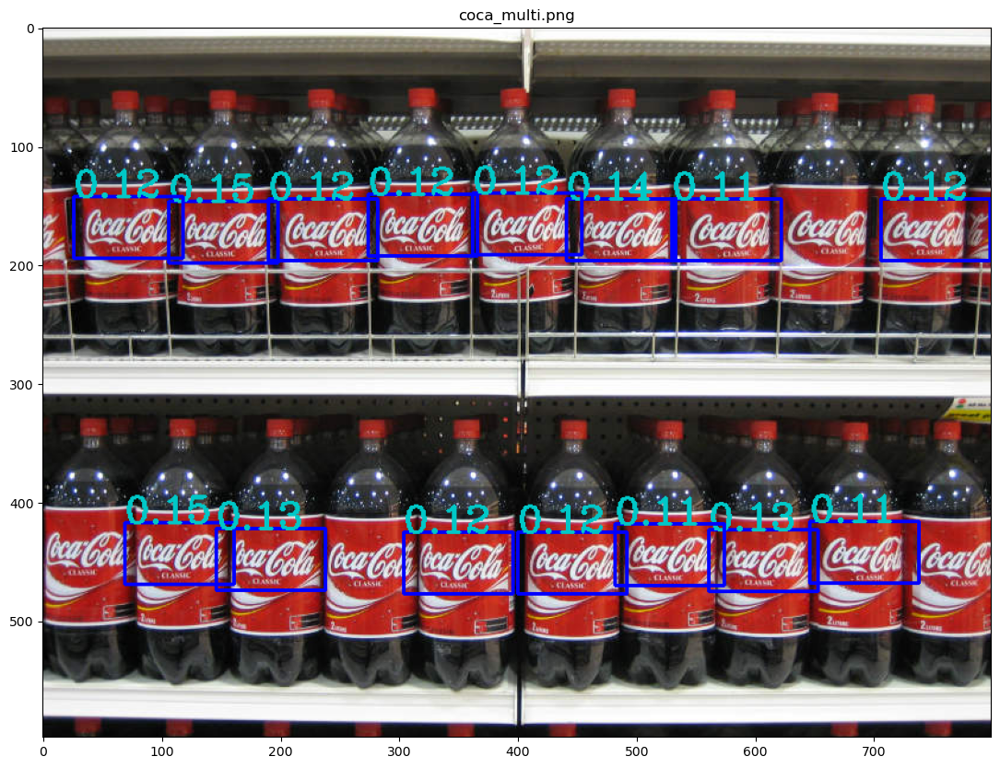

In [18]:
template_path = './template/pattern.png'

root = './images'
img_name = 'coca_multi.png'   
img_path = f'{root}/{img_name}'
img = cv.imread(img_path)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

bboxes,scores = get_multi_detections(template_path, img_path, resize_template=(0.23,0.3), resize_img=None, threshold_p=0.72)

print('Detecciones: ', len(bboxes))
for bbox,score in zip(bboxes,scores):
    crop = img[bbox[1]:bbox[3],bbox[0]:bbox[2]]
    cv.rectangle(img, (bbox[0],bbox[1]), (bbox[2],bbox[3]), (0,0,255), 2)
    cv.putText(img,str(round(score,2)),(bbox[0],bbox[1]),fontFace=3,fontScale=(bbox[3]-bbox[1])*0.02,color=(0,200,200),thickness=2)

plt.figure(figsize=(15,10))
plt.imshow(img)
plt.title(img_name)
plt.show()

### **3. Generalizar el algoritmo del item 2 para todas las imágenes.**

Se generaliza el método desarrollado anteriormente para capturar la mayor cantidad de ocurrencias de logo en las imágenes.

In [19]:
from numpy import dot
from numpy.linalg import norm

def detect_logo(logo_edges_bw:np.array, logo_bw:np.array, logo_wb:np.array, img_name:str)->None:
    ''' 
    Función que generaliza la detección de un template en una imagen

    Parameters:
    logo_edges_bw: imagen a detectar, pre-procesada con binarización y detección de bordes
    logo_bw: imagen a detectar en escala de grices binarizada
    logo_wb: negativo de imagen a detectar en escala de grices binarizada
    img_name: nombre de la imagen a procesar, sólo el nombre no el path, todas se buscan en './images'

    Return:
    La función realiza el plot de las detecciones con sus scores.
    '''

    # Lectura y pre-procesamiento de la imagen target
    root = './images'
    img_path = cv.imread(f'{root}/{img_name}')

    img_rgb= cv.cvtColor(img_path, cv.COLOR_BGR2RGB)
    img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
    # img_gray = apply_clahe_eq(img_gray)
    _,img_bw = cv.threshold(img_gray, 150, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    edges2 = cv.Canny(img_bw, threshold1=10, threshold2=10)
    _,img_edges_bw = cv.threshold(edges2, 150, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

    # Lista para almacenar resultados de Template-Matching
    results = []
    # Escaleos a realizar de la imagen template
    rescales = [0.25,0.8,1,1.2,2,3]
    # Se realiza una busqueda de template en la imagen target para distintos resize del logo
    for rescale in rescales:
        # logo_edges_bw = apply_clahe_eq(logo_edges_bw)
        gp_prev = cv.resize(logo_edges_bw, None, fx=rescale, fy=rescale)
        # A partir de la imagen escalada se genera una piramide de una octava
        gp = gaussian_pyramid(gp_prev,1)
        # Se recorren las imagenes de logo de la pirámide
        for n_pyr, template in enumerate(gp):
            template = np.uint8(template)
            w, h = template.shape[::-1]

            # Se intenta detectar el logo en la imagen
            try:
                res = cv.matchTemplate(img_edges_bw, template, cv.TM_CCOEFF_NORMED)
                # Se fija como límite de detección el 20% del máximo, despues se filtra con NMS
                threshold = res.max()*0.2
                loc = np.where( res >= threshold)

                bboxes = []
                scores = []
                for pt in zip(*loc[::-1]):
                    bboxes.append([pt[0],pt[1],pt[0] + w, pt[1] + h])
                    scores.append(res[pt[1],pt[0]])

                # Unificacion de bboxes con NMS bien conservador
                bboxes,scores = nms_python(np.array(bboxes),np.array(scores),0.1)
                # Se guarda toda la info de cada deteccion
                for score,bbox in zip(scores,bboxes):
                    results.append([score,(bbox[0],bbox[1]),w,h,n_pyr,rescale])
            # Si no se puede por dimensiones, se saltea el caso puntual
            except:
                pass

    # En esta segunda etapa se toma cada candidato de Template-Matching y se compara
    # cada crop con las dos imágenes _bw y _wb del logo, y se genera un segundo score
    # basado en HOG. 
    hog = cv.HOGDescriptor()
    results1 = []
    for r in results:
        # Generamos el crop de la imagen target para cada candidato
        h1,w1 = img_bw.shape
        xmin = r[1][0]
        ymin = r[1][1]
        # Se validan los límites porque puede pasar que el punto esté fuera de rango
        if xmin < 0:
            xmin = 0
        if ymin < 0:
            ymin = 0

        xmax = xmin + r[2]
        ymax = ymin + r[3]
        if xmax > w1:
            xmax = w1-1
        if ymax > h1:
            ymax = h1-1
        
        if xmin > w1 or ymin > h1:
            pass
        else:
            # Validadas las dimensiones se genera el crop
            crop = img_bw[ymin:ymax,xmin:xmax]
            h,w = logo_bw.shape
            # Se lo escala al tamanio de las imagenes de logo
            crop = cv.resize(crop,(w,h))
            # Se calculan los vectores de HOG para las tres imgs
            h1 = hog.compute(crop)
            h2 = hog.compute(logo_bw)
            h3 = hog.compute(logo_wb)
            # Se calcula similaridad de imagenes a partir de los vectores
            cos_sim1 = dot(h1, h2)/(norm(h1)*norm(h2))
            cos_sim2 = dot(h1, h3)/(norm(h1)*norm(h3))
            # Nos quedamos con el maximo por ser similaridad coseno la metrica
            score = np.max([cos_sim1,cos_sim2])
            # Se guarda cada candidato con su score de HOG para filtrar al final
            results1.append([score,r])


    # Consultamos si hay candidatos de match
    if len(results1) > 0:
        # Ordenamos por score HOG, ascendente
        best_detect1 = sorted(results1, key=lambda x: x[0])
        # El ultimo es el mejor
        best_score = best_detect1[-1][0]
        best_detects = [best_detect1[-1][1]]
        # Filtramos la lista y nos quedamos con los que matcheen al menos al 93% del maximo
        for b in best_detect1:
            if b[0] >= 0.93*best_score:
                best_detects.append(b[1])

        # Ploteamos los bbox y su score 
        for best_detect in best_detects:

            ## Print detections details
            # print('Pyr: ', best_detect[4])
            # print('Rescale: ',best_detect[5])
            # print('Confidence: ', round(best_detect[0],2))
            img_rgb = cv.rectangle(img_rgb, best_detect[1], (best_detect[1][0] + best_detect[2], best_detect[1][1] + best_detect[3]), (0,200,5), 2)
            cv.putText(img_rgb,str(round(best_detect[0],2)),best_detect[1],fontFace=3,fontScale=best_detect[3]*0.02,color=(100,250,50),thickness=int(best_detect[3]*0.05))

        plt.figure(figsize=(10,10))
        plt.imshow(img_rgb)
        plt.title(img_name)
        plt.show()
    else:
        print('Logo no encontrado')

Aplicamos la función de detección de logo a todas las imágenes de la carpeta imagenes:

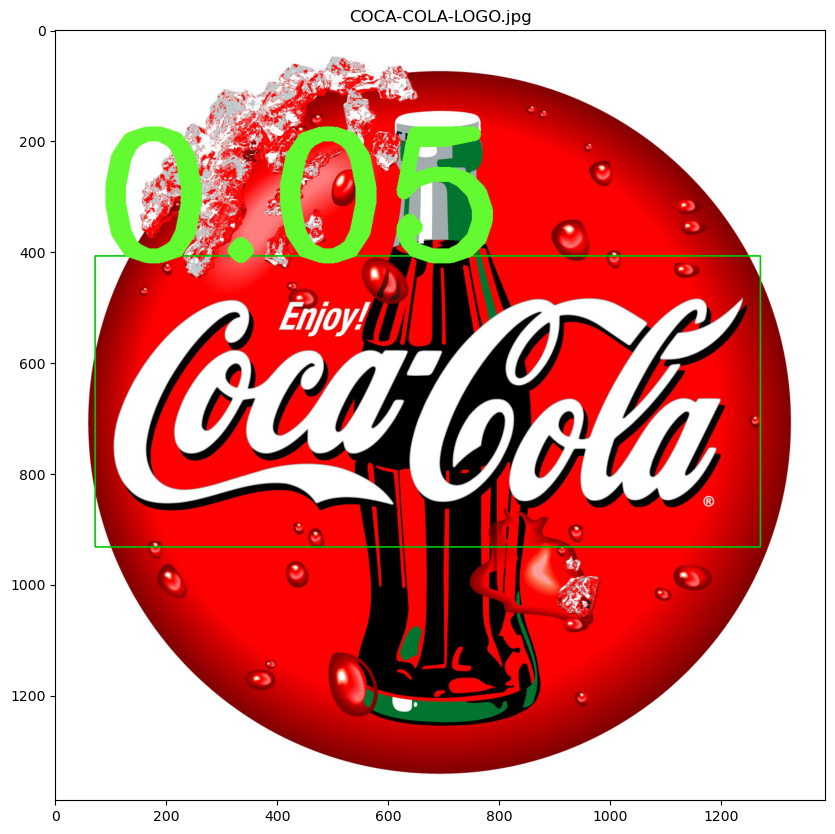

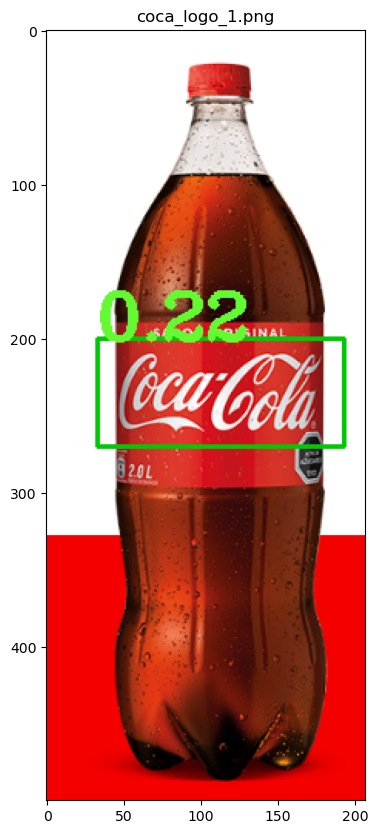

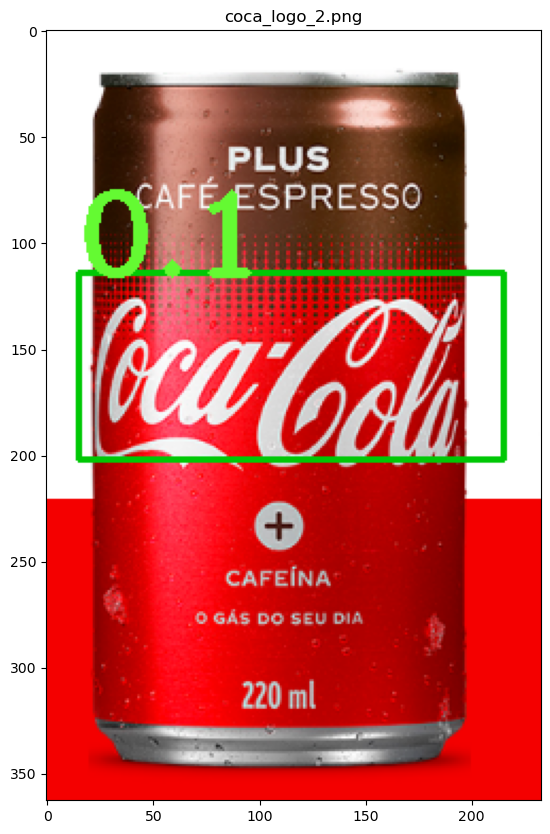

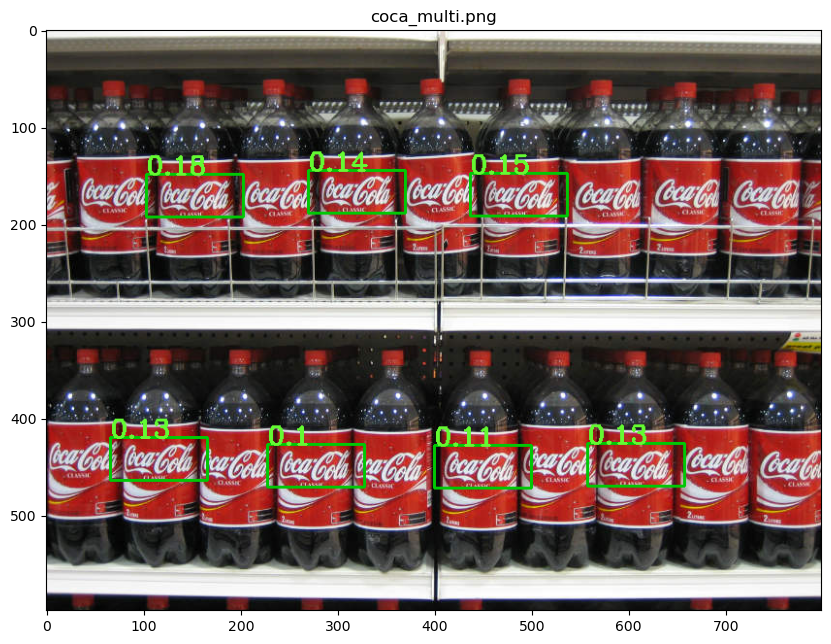

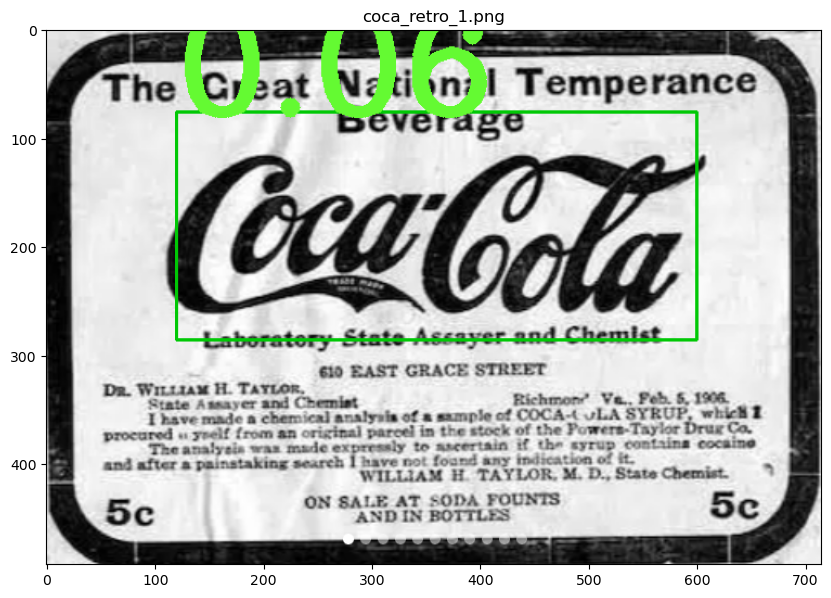

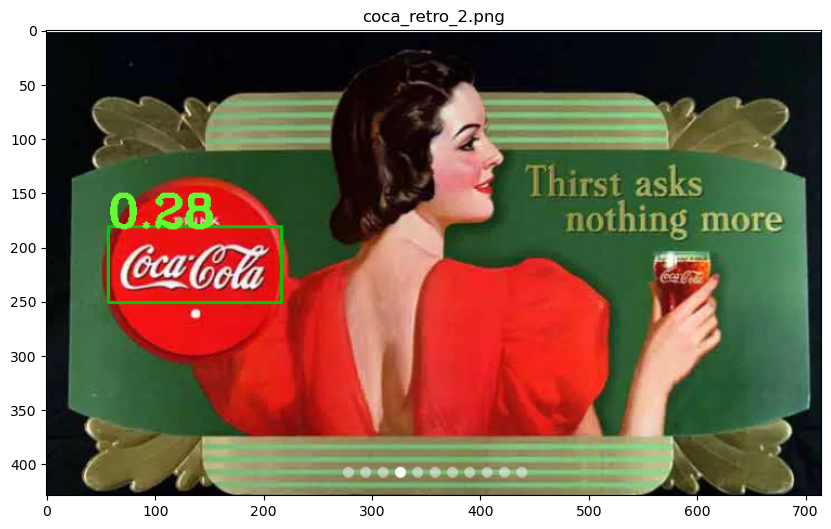

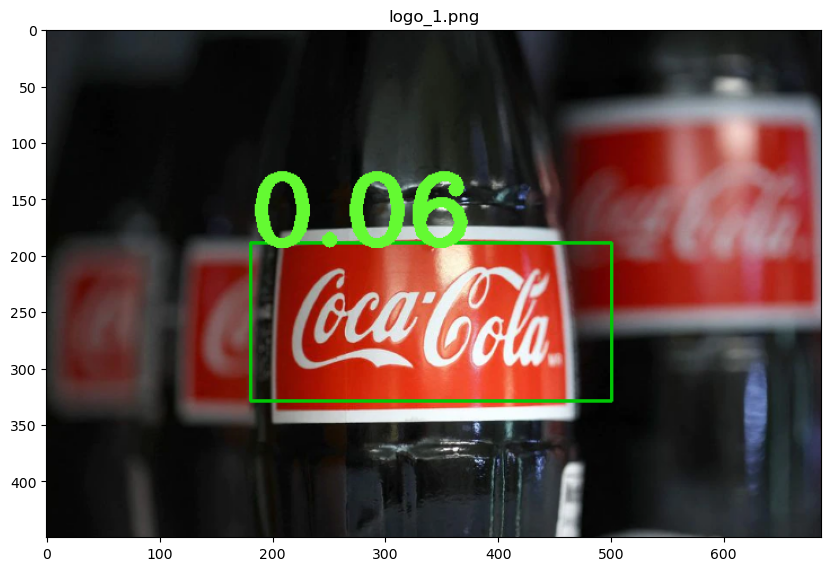

In [20]:
for img_name in os.listdir('./images'):
    if 'png' in img_name or 'jpg' in img_name:

        detect_logo(logo_edges_bw, logo_bw, logo_wb, img_name)

**Conclusión**

Se pudieron detectar con éxito la mayor cantidad de logos de las imágenes propuestas.

El mayor inconveniente vino dado por la diversidad de imágenes a buscar, tanto en tamaño como en colores.

De las pruebas iniciales queda demostrado que es posible detectar más logos en la imagen coca_multi.png, pero sacrificando capacidad de generalización a otras imágenes.

En resumen, en este TP se pudo demostrar la potencia de este método de detección para casos en los las condiciones pueden considerarse controladas. Es importante destacar que no se está entrenando ningún modelo, podría decirse que se trata de un método  no supervisado de detección de objetos.

## Pruebas con descriptores

Se intenta encarar la solución del TP por medio de descriptores como SIFT, aprovechando su característica de invariancia a la escala, que es uno de los principales desafíos del TP, pero no se pudo llegar a buenos resultados.

El mayor problema radica en la falta de un método para detectar matcheos correctos. Una posible utilización de estos métodos es la determinación de la escala del logo en la imagen target, a partir de la distribución de puntos matcheados correctamente. Y una vez que definimos la escala, podemos realizar el resize del template y buscarlo con más certeza. 

Pero la inconsistencia de los resultados tornaron inviable esta solución.

Se deja el código solo para observar los plots y ver la falta de consistencia para las distintas imágenes y pre-procesamientos.

In [21]:
def get_imgs(img_name):
    
    template_path = './template/pattern.png'
    root = './images'
    # img_name = os.listdir(root)[0]
    img_path = f'{root}/{img_name}'

    logo = cv.imread(template_path)
    img = cv.imread(img_path)


    logo_gray = cv.cvtColor(logo, cv.COLOR_BGR2GRAY)
    # logo_gray = cv.resize(logo_gray, None, fx=4, fy=4)
    # logo_gray = apply_clahe_eq(logo_gray)
    img_rgb= cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
    # img_gray = apply_clahe_eq(img_gray)

    (thresh, logo_bw) = cv.threshold(logo_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    (thresh, img_bw) = cv.threshold(img_gray, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

    logo_edges = cv.Canny(logo_bw, threshold1=10, threshold2=10)
    img_edges = cv.Canny(img_bw, threshold1=10, threshold2=10)

    (_, logo_edges_bw) = cv.threshold(logo_edges, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)
    (_, img_edges_bw) = cv.threshold(img_edges, 128, 255, cv.THRESH_BINARY | cv.THRESH_OTSU)

    imgs_to_test = [(logo,img),
                    (logo_gray,img_gray),
                    (logo_bw,img_bw),
                    (logo_edges,img_edges),
                    (logo_edges_bw,img_edges_bw)]

    return imgs_to_test[3], imgs_to_test

COCA-COLA-LOGO.jpg
Pyramid:  0


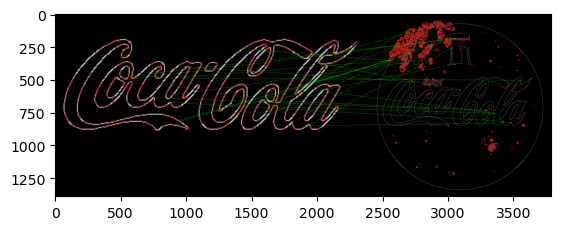

Pyramid:  1


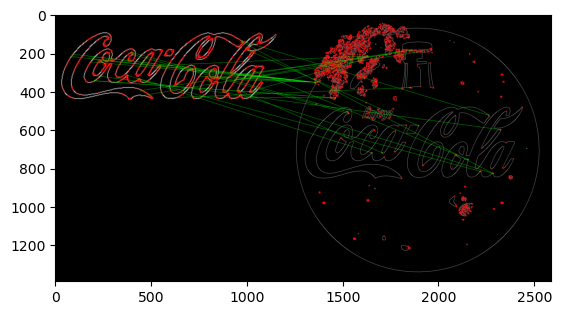

Pyramid:  2


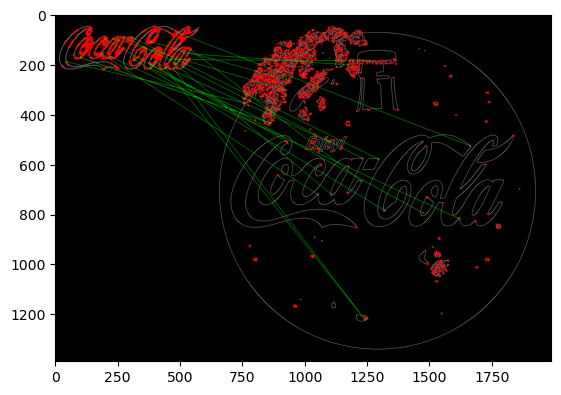

Pyramid:  3


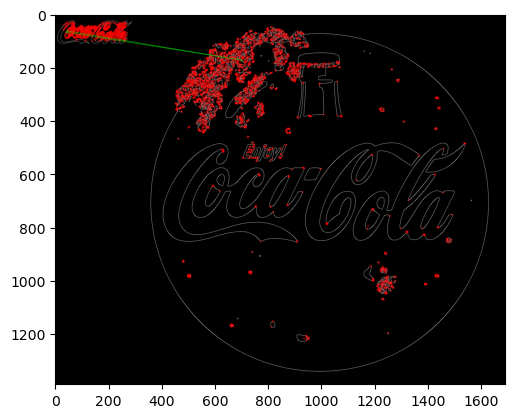

Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
coca_logo_1.png
Pyramid:  0


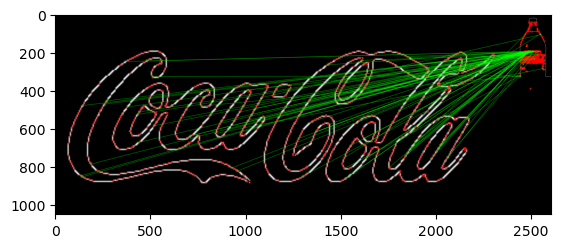

Pyramid:  1


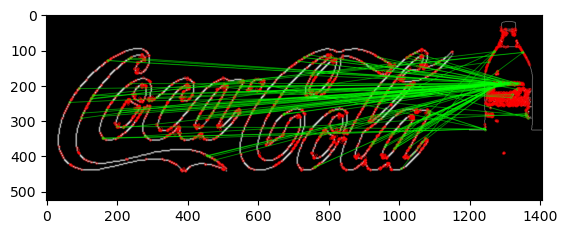

Pyramid:  2


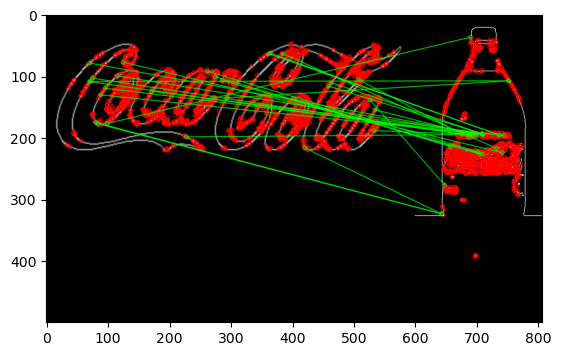

Pyramid:  3


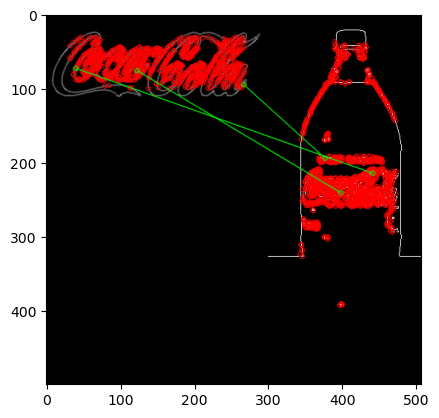

Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
coca_logo_2.png
Pyramid:  0


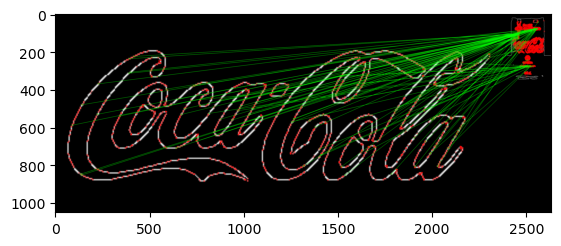

Pyramid:  1


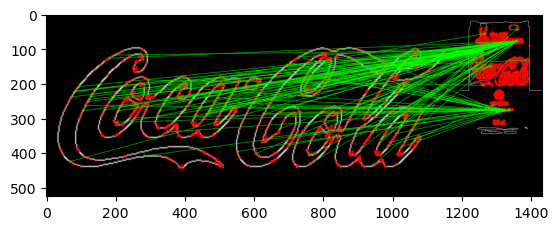

Pyramid:  2


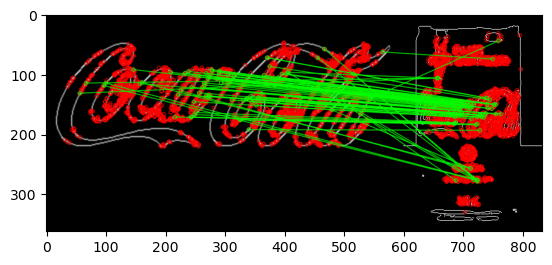

Pyramid:  3


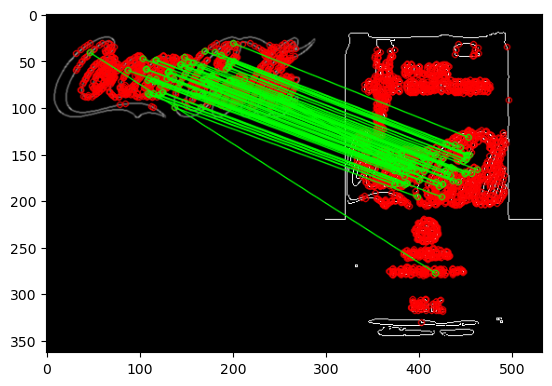

Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
coca_multi.png
Pyramid:  0


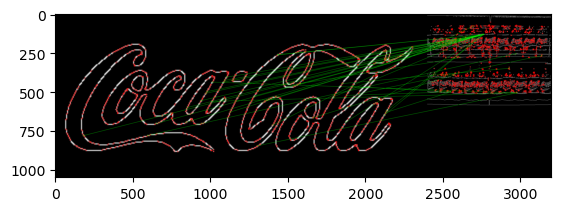

Pyramid:  1


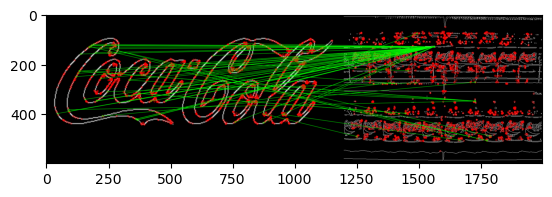

Pyramid:  2


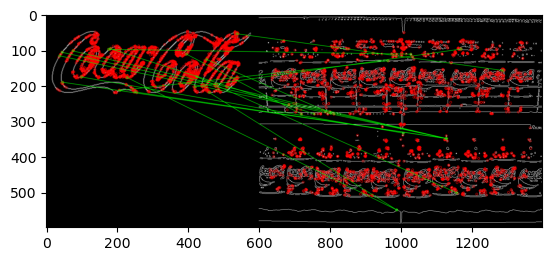

Pyramid:  3
Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
coca_retro_1.png
Pyramid:  0


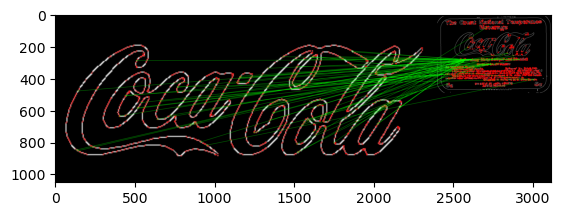

Pyramid:  1


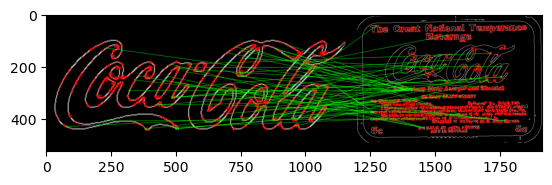

Pyramid:  2


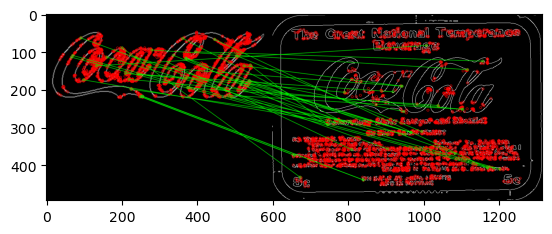

Pyramid:  3


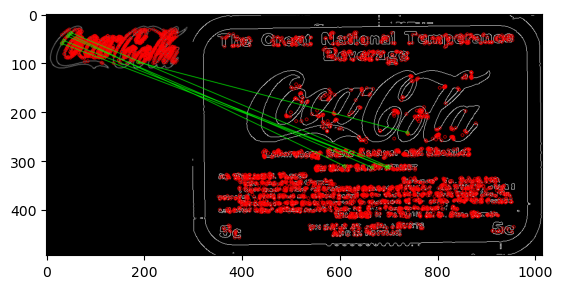

Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
coca_retro_2.png
Pyramid:  0


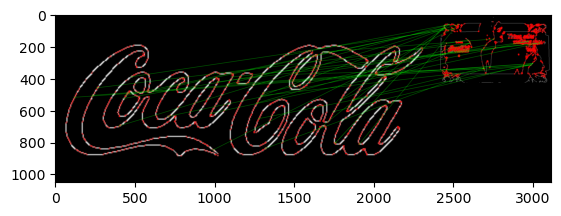

Pyramid:  1


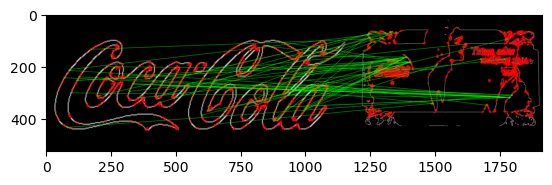

Pyramid:  2


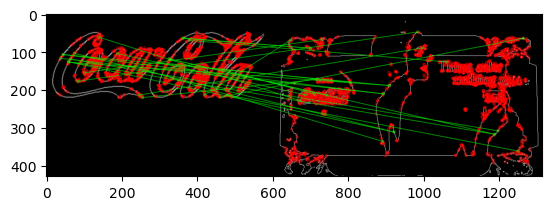

Pyramid:  3
Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8
logo_1.png
Pyramid:  0


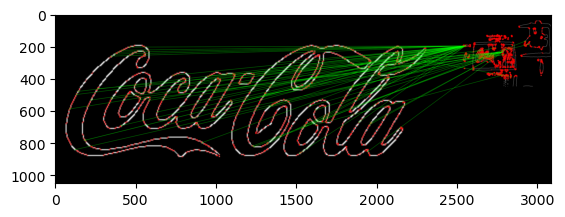

Pyramid:  1


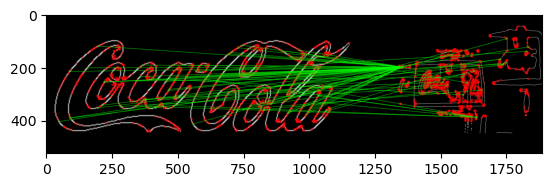

Pyramid:  2


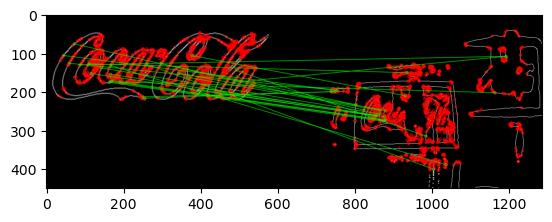

Pyramid:  3


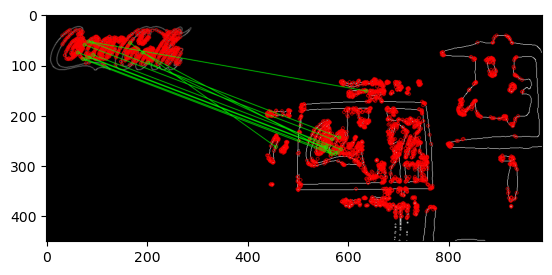

Pyramid:  4
Pyramid:  5
Pyramid:  6
Pyramid:  7
Pyramid:  8


In [22]:
sift = cv.SIFT_create()
orb = cv.ORB_create(nfeatures=3000)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                table_number = 6, # 12
                key_size = 12,     # 20
                multi_probe_level = 1) #2
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(index_params,search_params)

# # BFMatcher con parámetros por defecto
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=False)


root = './images'

for img_name in os.listdir(root):
    print(img_name)
    tupla_imgs, _ = get_imgs(img_name)
    logo_im = cv.resize(tupla_imgs[0], None, fx=6, fy=6)
    gp = gaussian_pyramid(logo_im,8)


    # kp1, des1 = orb.detectAndCompute(tupla_imgs[0],None)
    kp2, des2 = orb.detectAndCompute(tupla_imgs[1],None)
    
    for n_pyr, logo_im in enumerate(gp):
        print('Pyramid: ', n_pyr)
        logo_im = np.uint8(logo_im)

        kp1, des1 = orb.detectAndCompute(logo_im,None)    

        matches = flann.knnMatch(des1, des2, k=2)
        # Need to draw only good matches, so create a mask
        matchesMask = [[0,0] for i in range(len(matches))]
        # ratio test as per Lowe's paper
        cnt = 0
        # try:
        for i,(m,n) in enumerate(matches):
            if m.distance < 0.7*n.distance:
                matchesMask[i]=[1,0]
                cnt +=1

        if cnt > 1:
            draw_params = dict(matchColor = (0,255,0),
                            singlePointColor = (255,0,0),
                            matchesMask = matchesMask,
                            flags = cv.DrawMatchesFlags_DEFAULT)
            
            img3 = cv.drawMatchesKnn(logo_im, kp1, tupla_imgs[1], kp2,matches,None,**draw_params)

            plt.figure()
            plt.imshow(img3)
            plt.show()
        # except e:
        #     print(e)

COCA-COLA-LOGO.jpg


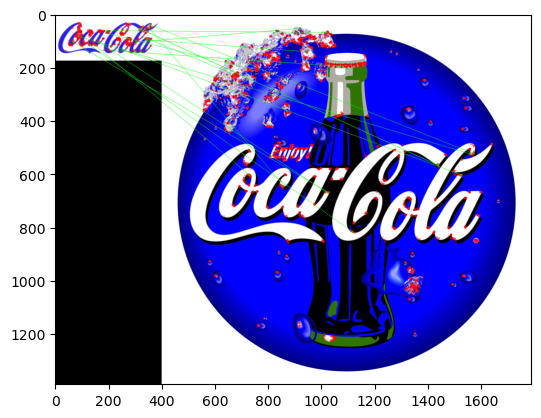

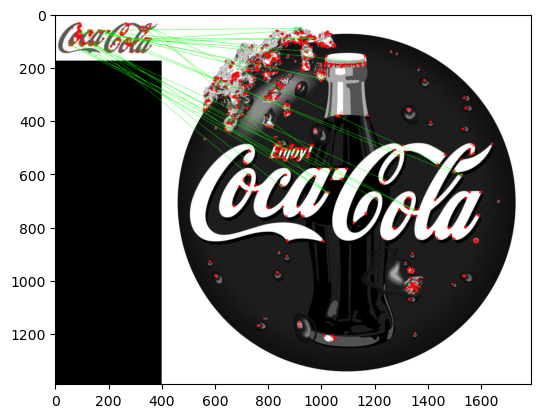

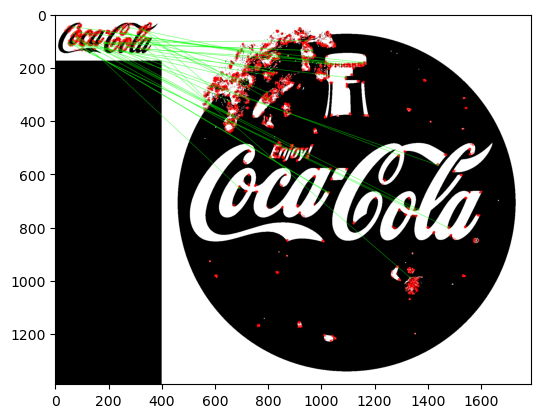

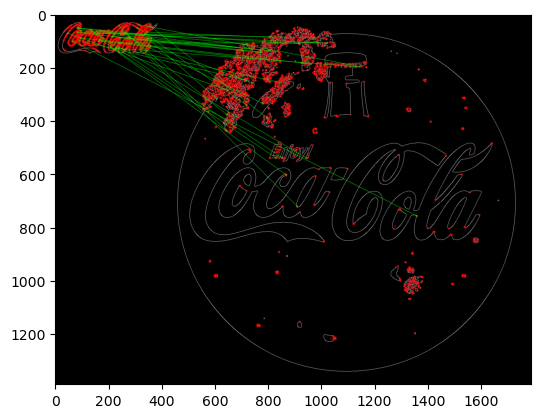

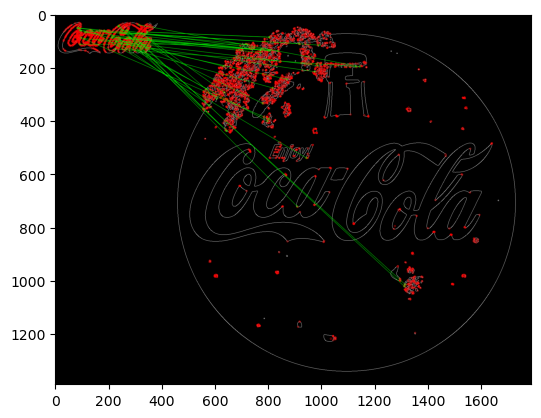

coca_logo_1.png


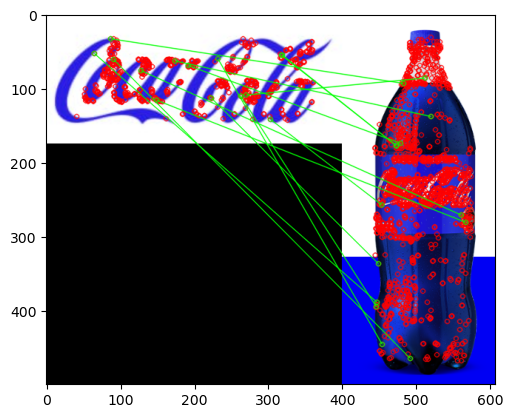

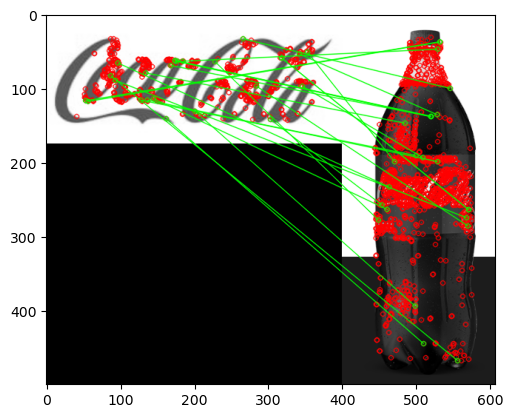

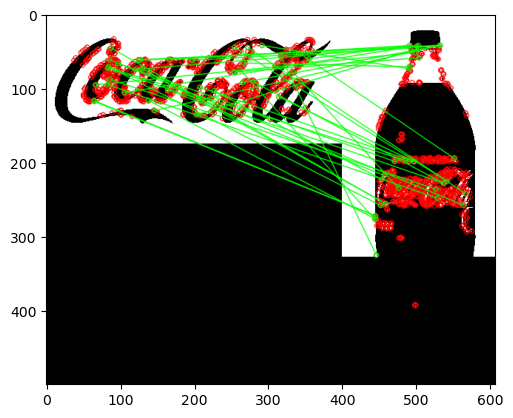

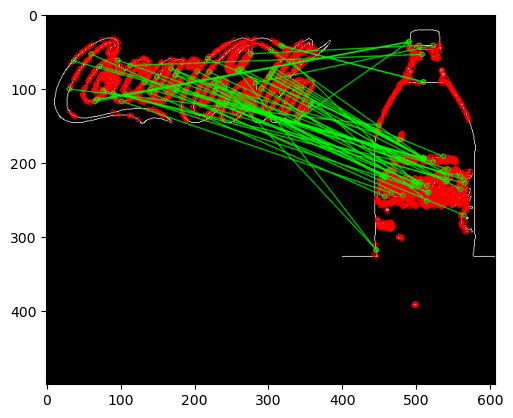

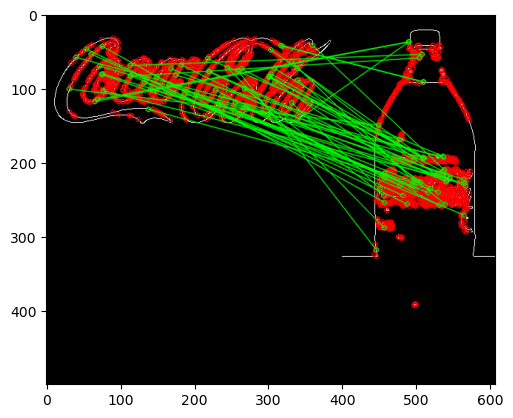

coca_logo_2.png


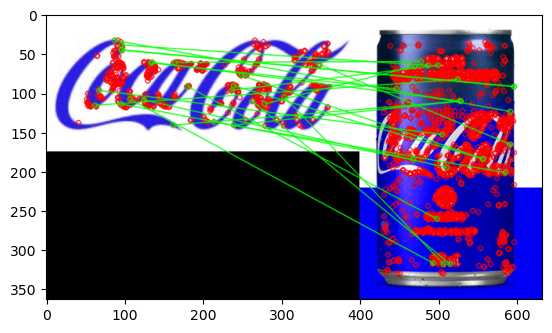

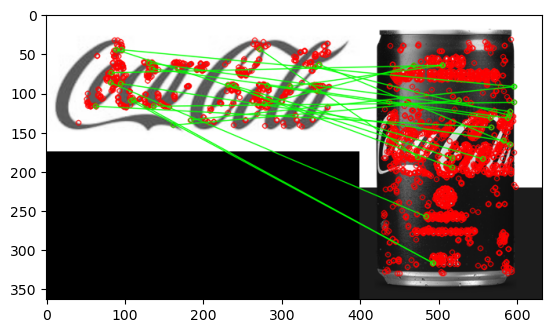

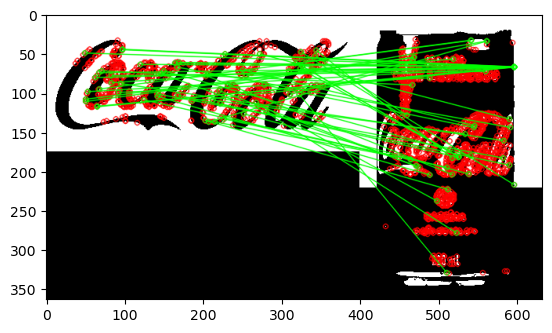

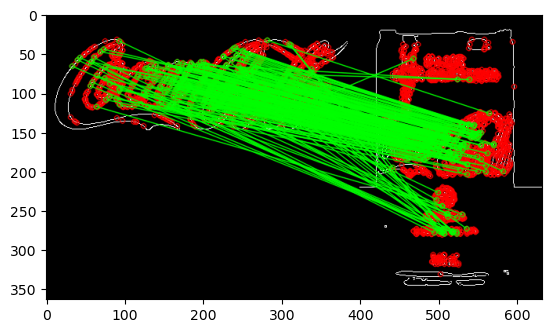

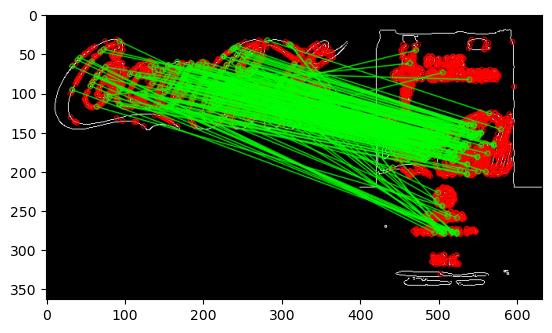

coca_multi.png


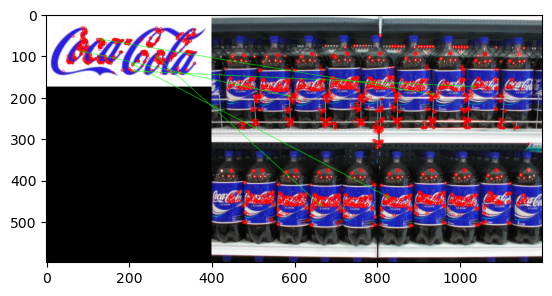

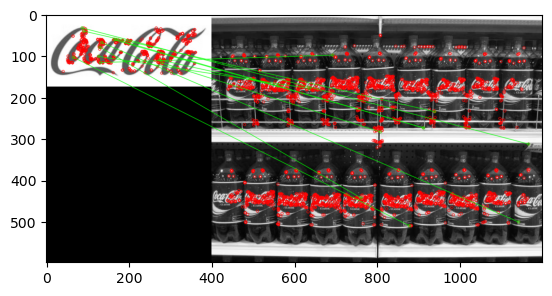

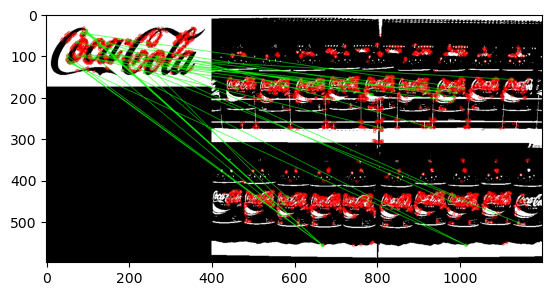

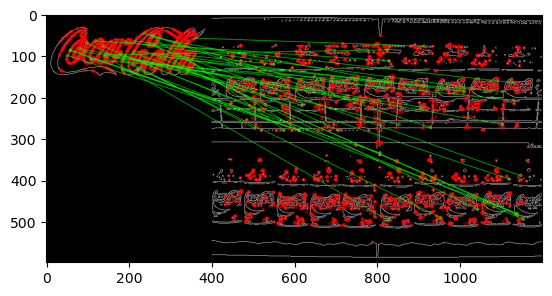

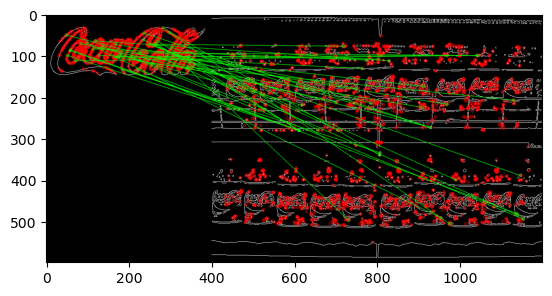

coca_retro_1.png


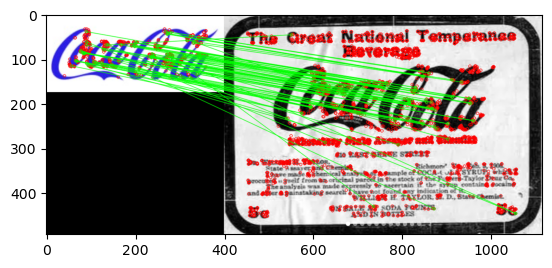

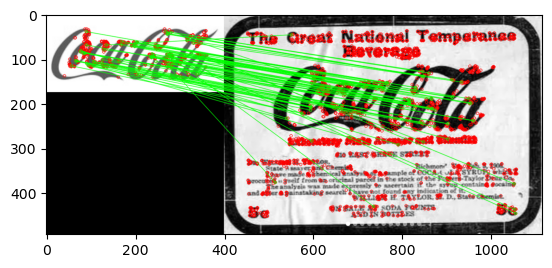

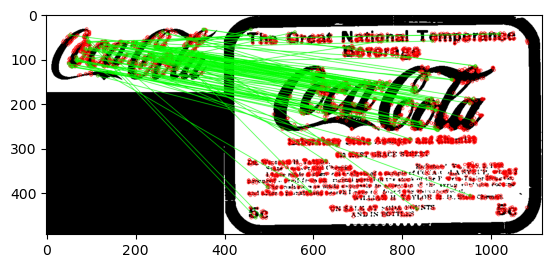

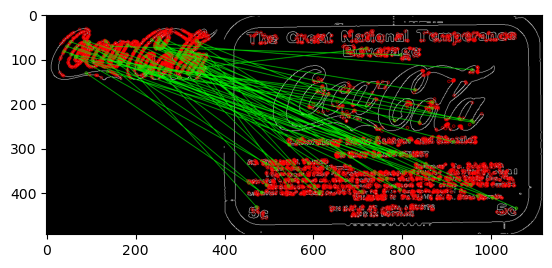

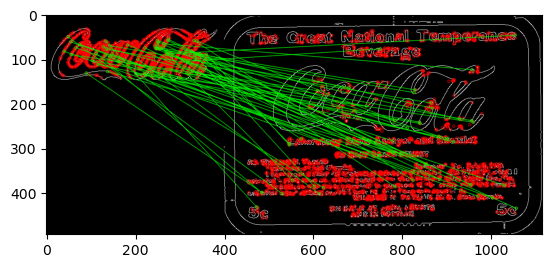

coca_retro_2.png


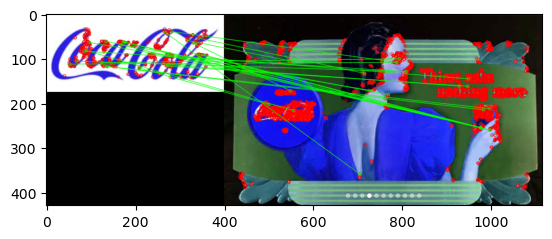

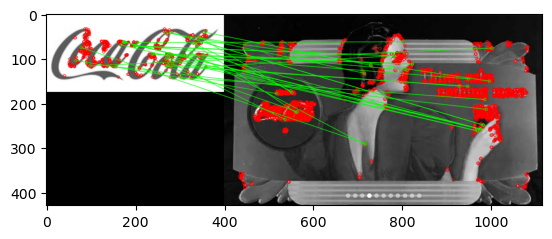

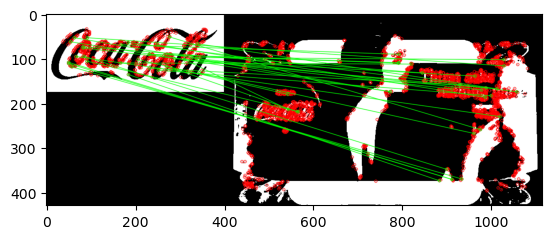

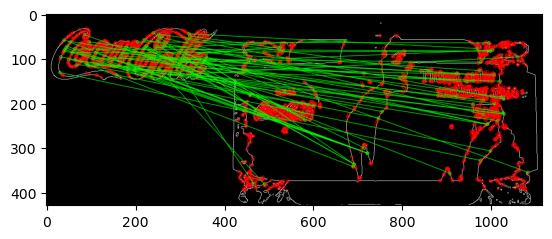

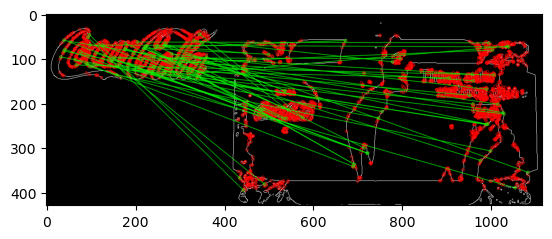

logo_1.png


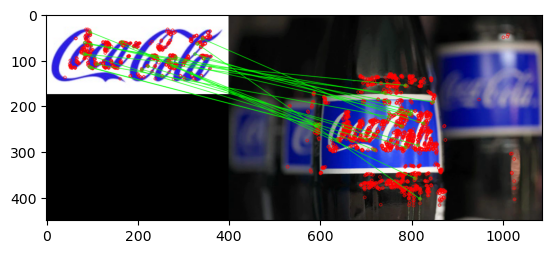

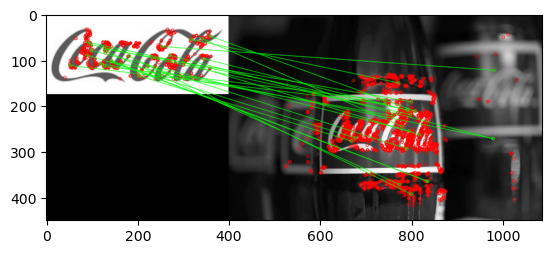

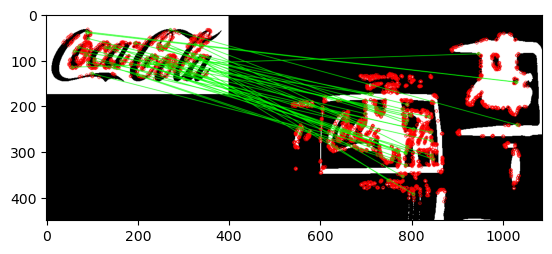

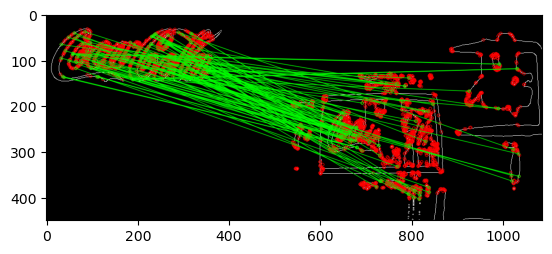

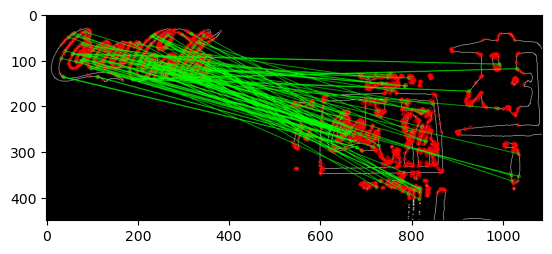

In [23]:
sift = cv.SIFT_create()
orb = cv.ORB_create(nfeatures=3000)

# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                table_number = 6, # 12
                key_size = 12,     # 20
                multi_probe_level = 1) #2
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(index_params,search_params)

# # BFMatcher con parámetros por defecto
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=False)

# # Detector de esquinas de Shi-Tomassi (imagen, Nmax, calidad, distancia mínima)
# #corners = cv.goodFeaturesToTrack(gray,10,0.01,20)
# corners = cv.goodFeaturesToTrack(gray,98,0.01,10)
# corners = np.int0(corners)
# for i in corners:
#     x,y = i.ravel()

for img_name in os.listdir(root):
    print(img_name)    
    _, imgs_to_test = get_imgs(img_name)

    for tupla_imgs in imgs_to_test:
        # kp1, des1 = sift.detectAndCompute(tupla_imgs[0], None)
        # kp2, des2 = sift.detectAndCompute(tupla_imgs[1], None)
        kp1, des1 = orb.detectAndCompute(tupla_imgs[0],None)
        kp2, des2 = orb.detectAndCompute(tupla_imgs[1],None)
        # img_esq1 = np.float32(tupla_imgs[0])
        # corners = cv.goodFeaturesToTrack(img_esq1,98,0.01,1)
        # kp1 = [cv.KeyPoint(x[0][1], x[0][0], 1) for x in corners]
        # img_esq2 = np.float32(tupla_imgs[1])
        # corners = cv.goodFeaturesToTrack(img_esq2,98,0.01,1)
        # kp2 = [cv.KeyPoint(x[0][1], x[0][0], 1) for x in corners]

        # # kp1, des1 = orb.compute(tupla_imgs[0],kp1)
        # # kp2, des2 = orb.compute(tupla_imgs[1],kp2)
        # kp1, des1 = sift.compute(tupla_imgs[0],kp1)
        # kp2, des2 = sift.compute(tupla_imgs[1],kp2)

        
        matches = flann.knnMatch(des1, des2, k=2)
        # Need to draw only good matches, so create a mask
        matchesMask = [[0,0] for i in range(len(matches))]
        # ratio test as per Lowe's paper
        cnt = 0
        try:
            for i,(m,n) in enumerate(matches):
                if m.distance < 0.8*n.distance:
                    matchesMask[i]=[1,0]
                    cnt +=1

            if cnt > 1:
                draw_params = dict(matchColor = (0,255,0),
                                singlePointColor = (255,0,0),
                                matchesMask = matchesMask,
                                flags = cv.DrawMatchesFlags_DEFAULT)
                
                img3 = cv.drawMatchesKnn(tupla_imgs[0], kp1, tupla_imgs[1], kp2,matches,None,**draw_params)

                plt.figure()
                plt.imshow(img3)
                plt.show()
        except:
            pass


In [24]:
to = time.time()

print('Tiempo de ejecución total: ', round(to-since), 'secs.')

Tiempo de ejecución total:  116 secs.
